# Yolo Demo Full

В данном примере реализован следующий алгоритм:

1. Получаем эмбединги для текстового запроса с помощью модели Clip
2. Среди предпосчитанных эмбедингов для кропов находим наиболее похожие на вектор из п.1 (в данном ноутбуке работает brute-force -- предыдущая реализация Annoy работала недостаточно хорошо и пропускала часть значимых результатов или могла долго работать. В случае использования ANN алгоритмов стоит уделить большее внимание на гиперпараметры и качество работы таких алгоритмов)
3. Берем топ-N кропов, находим для них соответствующие картинки
4. Дополнительно находим кропы с Cosine similarity, уверенностью модели (objectness) и размером больше порога.
5. Проводим NMS найденных кропов
6. Визуализируем найденные NMS - кропы на картинках 
7. Проводим доразметку выбранных картинок, запускаем обучение.

In [1]:
import sys

sys.path.append("../yolov5")

In [2]:
import os
import shutil

import clip
import cv2
import jupyter_innotater as ji
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import torch
import yaml
from assh_utils import nms
from tqdm.notebook import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
%matplotlib inline

cpu


In [3]:
class Detector:
    def __init__(
        self,
        clip_model,
        clip_preprocess,
        images,
        index,
        device,
        cos_thr=0.2,
        min_size=(32, 32),
        min_conf=0.05,
        iou_thr=0.45,
        max_crops=10,
    ):
        self.clip_model = clip_model
        self.clip_preprocess = clip_preprocess
        self.images = images
        self.index = index
        self.device = device
        self.cos_thr = cos_thr
        self.min_size = min_size
        self.min_conf = min_conf
        self.iou_thr = iou_thr
        self.max_crops = max_crops

    def get_vector_text(self, text):
        text_inputs = torch.cat([clip.tokenize(text)]).to(self.device)
        with torch.no_grad():
            text_features = self.clip_model.encode_text(text_inputs)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        return text_features[0].cpu().numpy()

    def get_vector_image(x):
        img = PIL.Image.open(x)
        img.thumbnail((640, 640), PIL.Image.ANTIALIAS)
        return self._get_vector_image(img)

    def _get_vector_image(img):
        img.show()
        image_input = self.clip_preprocess(img).unsqueeze(0).to(self.device)
        with torch.no_grad():
            image_features = self.clip_model.encode_image(image_input)
        image_features /= image_features.norm(dim=-1, keepdim=True)
        return image_features[0].cpu().numpy()

    @staticmethod
    def _cos_sim_matrix(a, b):
        return np.dot(a, b) / np.linalg.norm(b)

    def get_ns_by_vector(self, vec, n):
        vec = vec.astype(np.float16)
        dist = self._cos_sim_matrix(self.index, vec)
        idx = np.argsort(dist)
        top_idx = idx[: -n - 1 : -1]
        return top_idx, dist[top_idx], dist

    def get_ns_by_text(self, text, n):
        return self.get_ns_by_vector(self.get_vector_text(text), n)

    def get_prediction_df(self, text, n):
        idx, dist, all_dist = self.get_ns_by_text(text, n)
        images_to_display = self.images.loc[idx].assign(dist=dist).copy()

        img_same = self.images[(self.images["image"].isin(images_to_display["image"]))].copy()
        img_same["dist"] = all_dist[img_same.index]
        img_same = img_same[
            (
                (img_same["dist"] > self.cos_thr)
                & (img_same["xmax"] - img_same["xmin"] >= self.min_size[0])
                & (img_same["ymax"] - img_same["ymin"] >= self.min_size[1])
                & (img_same["confidence"] > self.min_conf)
            )
            | img_same.index.isin(images_to_display.index)
        ]

        img_nms = nms(
            img_same[["xmin", "ymin", "xmax", "ymax"]].values,
            img_same["confidence"].values,
            self.iou_thr,
            max_dets=self.max_crops,
        )
        img_nms = img_same.iloc[img_nms]
        img_same["flag_orig"] = img_same.index.isin(images_to_display.index)
        img_same["flag_nms"] = img_same.index.isin(img_nms.index)
        return img_same

In [4]:
images = pd.read_pickle("/home/asciishell/s3/asciishell-fsod/RunYoloV2/train.done.pkl.zip")

clip_model, clip_preprocess = clip.load("/home/asciishell/s3/asciishell-fsod/models/ViT-B-32.pt", device)

index = np.load("/home/asciishell/s3/asciishell-fsod/RunYoloV2/train_emb.npy")

detector = Detector(
    clip_model,
    clip_preprocess,
    images,
    index,
    device,
    cos_thr=0.2,
    min_size=(32, 32),
    min_conf=0.05,
    iou_thr=0.45,
    max_crops=10,
)

In [5]:
text = "cat sitting"
query_result = detector.get_prediction_df(text, 50)

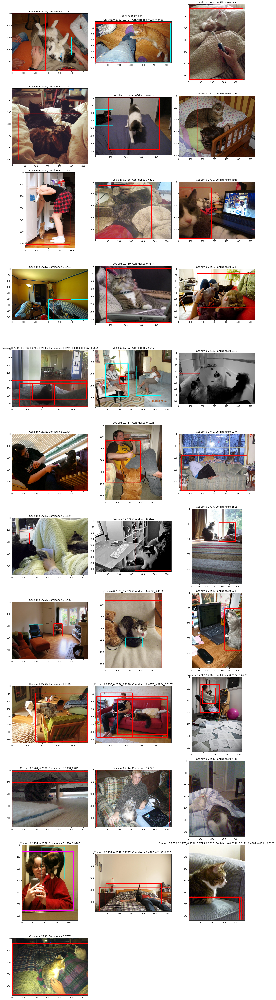

In [6]:
len_images = query_result["image"].nunique()
plt.figure(figsize=(18, (len_images // 3 + 1) * 6), facecolor="w")
for i, (img, meta) in enumerate(query_result.sort_values("dist").groupby("image")):
    image = cv2.imread(img.replace("/home/jupyter/mnt", "/home/asciishell"), cv2.IMREAD_COLOR)
    assert image is not None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for _, row in meta.iterrows():
        flag_orig = row['flag_orig']
        flag_nms = row['flag_nms']
        if not flag_nms and not flag_orig:
            continue
        image = cv2.rectangle(
            image,
            (row["xmin"], row["ymin"]),
            (row["xmax"], row["ymax"]),
            (255 * flag_orig, 255 * (not flag_orig), 255 * flag_nms),
            2 + flag_orig * 2 + flag_nms,
        )
    plt.subplot(len_images // 3 + 1, 3, i + 1)
    plt.imshow(image)
    dists = "_".join(["{:.4f}".format(x) for x in meta[meta['flag_orig']]["dist"].head(5)])
    confs = "_".join(["{:.4f}".format(x) for x in meta[meta['flag_orig']]["confidence"].head(5)])
    plt.title(f"Cos sim {dists}, Confidence {confs}")
plt.suptitle(f'Query: "{text}"')
plt.tight_layout()
plt.show()

In [ ]:
query_result

,xmin,ymin,xmax,ymax,confidence,class,name,labels,image,dist,flag_orig,flag_nms
2952,0,1,282,476,0.016135,0,person,20,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.275146,True,False
2960,1,0,412,477,0.056679,0,person,5,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.257080,False,False
2962,114,0,610,303,0.058554,57,couch,24,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.255127,False,False
2963,0,164,636,475,0.067935,0,person,10,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.245972,False,False
2964,4,237,632,475,0.069687,0,person,26,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.252930,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
4265482,322,324,465,475,0.732516,0,person,7,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.221802,False,False
4265483,361,115,460,178,0.763157,15,cat,9,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.247803,False,False
4265484,521,28,640,193,0.794210,15,cat,6,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.249390,False,False
4265485,250,147,448,442,0.837154,15,cat,3,/home/jupyter/mnt/s3/asciishell-fsod/LVIS/trai...,0.247925,False,False


In [57]:
repeats = 10
len_images = query_result["image"].nunique()

breeds = ['cat_{}'.format(x) for x in range(repeats)]
targets_exclude = np.zeros((len_images, 1), dtype='int')
targets_breed = np.zeros((len_images, len(breeds)), dtype='int')
targets_bboxes = np.zeros((len_images, repeats, 4), dtype='int') # (x,y,w,h) for each animal

query_images = []
for i, (img, meta) in enumerate(query_result.sort_values("dist").groupby("image")):
    query_images.append(img.replace("/home/jupyter/mnt", "/home/asciishell"))
    
    for j, (_, row) in enumerate(meta[meta['flag_orig'] | meta['flag_nms']].iterrows()):
        if j >= repeats:
            break
        x, y, w, h = row[['xmin', 'ymin', 'xmax', 'ymax']].values
        w -= x
        h -= y
        targets_bboxes[i, j] = x, y, w, h
        targets_breed[i, j] = 1

In [56]:
# Размечаем картинки
ji.Innotater(
    [
        ji.ImageInnotation(query_images), # Display the image itself
        ji.TextInnotation(query_images, multiline=False) # Display the image filename
    ],
    [
        ji.BinaryClassInnotation(targets_exclude, name='Exclude'), # Checkbox
        ji.RepeatInnotation(
            (ji.BoundingBoxInnotation, targets_bboxes), # Individual animal bounding box
            (ji.MultiClassInnotation, targets_breed,
                {'name':'Breed', 'classes':breeds, 'dropdown':True}), # Per-animal breed dropdown
            max_repeats=repeats, min_repeats=repeats
        )
    ]
)

Innotater(children=(HBox(children=(VBox(children=(ImagePad(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0…

In [58]:
def xywh2yolo(xywh, size):
    x, y, w, h = xywh
    x += w / 2
    y += h / 2
    x = x / size[1]
    w = w / size[1]
    y = y / size[0]
    h = h / size[0]
    return x, y, w, h

In [72]:
# Сохраняем датасет в формате для Yolo
result = []
dataset_path = "../datasets/custom/images/"
labels_path = "../datasets/custom/labels/"

cache = labels_path.replace("/labels/", "/labels.cache")
if os.path.exists(cache):
    os.unlink(cache)
os.makedirs(dataset_path, exist_ok=True)
os.makedirs(labels_path, exist_ok=True)

for im, bboxs in zip(query_images, targets_bboxes):
    name = im.split("/")[-1]
    shutil.copy2(im, dataset_path)
    annotation = ".".join(name.split(".")[:-1]) + ".txt"
    image = cv2.imread(im, cv2.IMREAD_COLOR)
    with open(labels_path + annotation, "wt") as f:
        for bbox in bboxs:
            if bbox.sum() == 0:
                continue
            xywh = xywh2yolo(bbox.astype(np.float32), image.shape)
            xywh = " ".join(["{:.6f}".format(x) for x in xywh])
            f.write("{} {}\n".format(15, xywh))

In [75]:
config = {
    'path': '../datasets/custom/',
    'train': 'images',
    'val': 'images',
    # 'test': None,
    'nc': 80,
    # 'nc': 1,
    # 'names': ['custom_object']
    'names': ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
        'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
        'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
        'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
        'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
        'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
        'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
        'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
        'hair drier', 'toothbrush'] 
}
# config['names'] = str(config['names'])
with open('./config.yaml', 'w') as f:
    yaml.dump(config, f)

In [86]:
!/home/asciishell/project/venv/bin/python3 \
    ../yolov5/train.py \
    --img 640 \
    --batch 16 \
    --epochs 3 \
    --data config.yaml \
    --weights models/yolov5m.pt \
    --cache \
    --freeze 10

train: weights=models/yolov5m.pt, cfg=, data=config.yaml, hyp=../yolov5/data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[10], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
git@github.com: Permission denied (publickey).
fatal: Could not read from remote repository.

Please make sure you have the correct access rights
and the repository exists.
Command 'git fetch && git config --get remote.origin.url' returned non-zero exit status 128.
YOLOv5 🚀 4295e05 torch 1.10.2+cpu CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momen